# An exercise to predict bank churn

This is an exercise that can be found on Kaggle here: https://www.kaggle.com/sakshigoyal7/credit-card-customers

This is intended as an introductory exercise for me where I wished to go through a publicly available project to gain some insight into how these projects are tackled as a whole. It is therefore based on the example notebook "bank-churn-data-exploration-and-churn-prediction" that can be found in this repository in the directory ```notebooks/example_notebooks```. The original notebook can be found here: https://www.kaggle.com/thomaskonstantin/bank-churn-data-exploration-and-churn-prediction/notebook

It is not intended to be a carbon copy of the original; I have changed things along the way as a bit of additional exercise. I have used a cut on the correlation of features with the attrition_flag, and I have not used PCA, as I ended up with fewer features. I have also not used all of the original dataset in the final test. This seems to be an unfair test, since this contains data that is represented in the training set and so this seems to me to be a source of data leakage. I have therefore cut the final test set to be only data that is not contained in the training set.

### Loading libraries and utilities

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as ex
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score as f1
from sklearn.metrics import confusion_matrix

import scikitplot as skplt

pyo.init_notebook_mode()
sns.set_style('darkgrid')
plt.rc('figure',figsize=(18,9))

/anaconda3/lib/python3.7/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


### Load data

In [2]:
c_data = pd.read_csv('../../data/BankChurners.csv')

In [3]:
c_data = c_data[c_data.columns[:-2]] # Removing last two columns, which are advised to be deleted on the data discussion on Kaggle
c_data.head(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [4]:
print('mean of dependent count = ', c_data['Customer_Age'].mean())
print('std of dependent count = ', c_data['Customer_Age'].std())
print('skewness of dependent count = ', c_data['Customer_Age'].skew())
print('kurtosis of dependent count = ', c_data['Customer_Age'].kurt())

fig = ff.create_distplot([c_data['Customer_Age']], group_labels=['Customer Age'], curve_type='normal')
fig.show()
# From the plot we see that customer age is approximately normal distributed

mean of dependent count =  46.32596030413745
std of dependent count =  8.016814032549084
skewness of dependent count =  -0.033605016317173456
kurtosis of dependent count =  -0.2886199152745088


In [5]:
ex.pie(c_data,names='Gender',title='Propotion Of Customer Genders')
# There are slightly more females than males

In [6]:
fig = ff.create_distplot([c_data['Dependent_count']], group_labels=['Dependent Count'], curve_type='normal')
fig.show()
# From the plot we see that dependent count has a right skew. With this being a distribution of only a few discrete values,
# it is not very easy to compare it with a normal distribution.

In [7]:
ex.pie(c_data,names='Education_Level',title='Propotion Of Education Levels')

In [8]:
ex.pie(c_data,names='Marital_Status',title='Propotion Of Different Marriage Statuses')

In [9]:
ex.pie(c_data,names='Card_Category',title='Proportion Of Different Card Categories')

In [10]:
fig = ff.create_distplot([c_data['Months_on_book']], group_labels=['Months on Book'], curve_type='normal')
fig.show()

In [11]:
print('Kurtosis of Months on book features is : {}'.format(c_data['Months_on_book'].kurt()))

Kurtosis of Months on book features is : 0.40010012019986707


This is a high kutosis, as opposed to what is stated in the original anaylsis, indicating a peak in the middle that is clearly seen at 36 months. Let's invesigate this further

In [12]:
print('number of people spending 35 months on book = :{}'.format(len(c_data['Months_on_book'][c_data['Months_on_book']==35])))
print('number of people spending 36 months on book = :{}'.format(len(c_data['Months_on_book'][c_data['Months_on_book']==36])))
print('number of people spending 37 months on book = :{}'.format(len(c_data['Months_on_book'][c_data['Months_on_book']==37])))

number of people spending 35 months on book = :317
number of people spending 36 months on book = :2463
number of people spending 37 months on book = :358


Let's have a look at the kurtosis if we clip the number of people spending 36 months on the books to be 360.

In [13]:
temp_series = c_data['Months_on_book']
temp_series = temp_series.drop(temp_series[temp_series==36][360:].index)
print('New number of people spending 36 months on book = :{}'.format(len(temp_series[temp_series==36])))
print('Kurtosis of Months on book features is : {}'.format(temp_series.kurt()))

New number of people spending 36 months on book = :360
Kurtosis of Months on book features is : -0.30669684318872337


In [14]:
fig = ff.create_distplot([temp_series], group_labels=['Months on Book'], curve_type='normal')
fig.show()

From this plot, we clearly see that the high kurtosis value is dominated by the number of people with 36 months on the books.

In [15]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Total_Relationship_Count'],name='Total no. of products Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Total_Relationship_Count'],name='Total no. of products Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of Total no. of products held by the customer")
fig.show()

In [120]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Months_Inactive_12_mon'],name='number of months inactive Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Months_Inactive_12_mon'],name='number of months inactive Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the number of months inactive in the last 12 months")
fig.show()

In [121]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Credit_Limit'],name='Credit_Limit Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Credit_Limit'],name='Credit_Limit Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the Credit Limit")
fig.show()

In [122]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Total_Trans_Amt'],name='Total_Trans_Amt Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Total_Trans_Amt'],name='Total_Trans_Amt Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the Total Transaction Amount (Last 12 months)")
fig.show()

In [123]:
ex.pie(c_data,names='Attrition_Flag',title='Proportion of churn vs not churn customers')

### Preprocessing

In [13]:
c_data['Attrition_Flag'].unique()

array(['Existing Customer', 'Attrited Customer'], dtype=object)

In [14]:
c_data['Attrition_Flag'] = c_data['Attrition_Flag'].replace({'Existing Customer':0, 'Attrited Customer':1})
c_data['Attrition_Flag'].unique()

array([0, 1])

In [15]:
c_data['Gender'].unique()

array(['M', 'F'], dtype=object)

In [16]:
c_data['Gender'] = c_data['Gender'].replace({'M':0, 'F':1})

Next we will create one hot representations of the catagories of interest

In [17]:
one_hots = ['Education_Level', 'Income_Category', 'Marital_Status', 'Card_Category']
drop_vals = ['Unknown', 'Unknown', 'Unknown', 'Platinum']

for i,j in zip(one_hots, drop_vals):
    c_data = pd.concat([c_data,pd.get_dummies(c_data[i]).drop(columns=[j])],axis=1)

one_hots = one_hots + ['CLIENTNUM']
c_data.drop(columns=one_hots, inplace=True)

In [18]:
c_data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,$40K - $60K,$60K - $80K,$80K - $120K,Less than $40K,Divorced,Married,Single,Blue,Gold,Silver
0,0,45,0,3,39,5,1,3,12691.0,777,...,0,1,0,0,0,1,0,1,0,0
1,0,49,1,5,44,6,1,2,8256.0,864,...,0,0,0,1,0,0,1,1,0,0
2,0,51,0,3,36,4,1,0,3418.0,0,...,0,0,1,0,0,1,0,1,0,0
3,0,40,1,4,34,3,4,1,3313.0,2517,...,0,0,0,1,0,0,0,1,0,0
4,0,40,0,3,21,5,1,0,4716.0,0,...,0,1,0,0,0,1,0,1,0,0


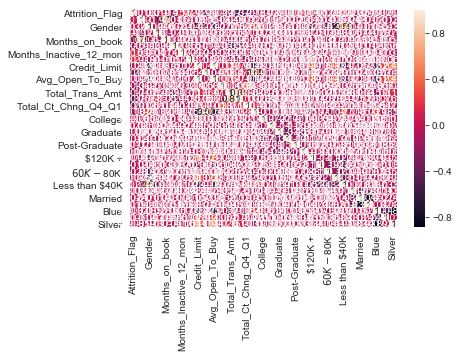

In [19]:
sns.heatmap(c_data.corr('pearson'),annot=True)

There is an imbalance in the attrition data, with the vast majority of the data being from the non-churn customers. Such an imbalance can cause a problem for most machine learning techniques, since the minority data can be pretty much ignored. In order to get around this, we can (and do here) use SMOTE to upsample the churn data.

In [20]:
oversample = SMOTE()
X, y = oversample.fit_resample(c_data[c_data.columns[1:]], c_data[c_data.columns[0]])

In [21]:
upsampled_df = X.assign(Churn=y)
upsampled_df.head()

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,$60K - $80K,$80K - $120K,Less than $40K,Divorced,Married,Single,Blue,Gold,Silver,Churn
0,45,0,3,39,5,1,3,12691.0,777,11914.0,...,1,0,0,0,1,0,1,0,0,0
1,49,1,5,44,6,1,2,8256.0,864,7392.0,...,0,0,1,0,0,1,1,0,0,0
2,51,0,3,36,4,1,0,3418.0,0,3418.0,...,0,1,0,0,1,0,1,0,0,0
3,40,1,4,34,3,4,1,3313.0,2517,796.0,...,0,0,1,0,0,0,1,0,0,0
4,40,0,3,21,5,1,0,4716.0,0,4716.0,...,1,0,0,0,1,0,1,0,0,0


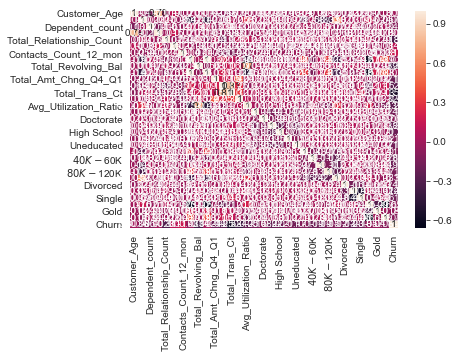

In [22]:
sns.heatmap(upsampled_df.corr('pearson'),annot=True)

In [38]:
cut_correlation = 0.2

corr = upsampled_df.corr('pearson')
upsampled_df = upsampled_df[corr['Churn'][corr['Churn'].abs()>cut_correlation].index]

upsampled_df.head()

,Total_Trans_Ct,Churn
0,42,0
1,33,0
2,20,0
3,20,0
4,28,0


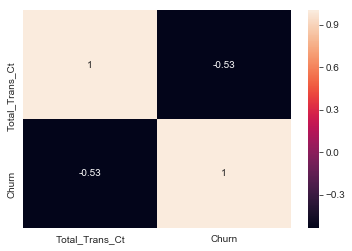

In [24]:
sns.heatmap(upsampled_df.corr('pearson'),annot=True)

In [25]:
train_x,test_x,train_y,test_y = train_test_split(upsampled_df[upsampled_df.columns[:-1]],
                                                 upsampled_df[upsampled_df.columns[-1]],
                                                 random_state=42)

In [26]:
train_x.head()

,Total_Trans_Ct
15927,74
5613,74
5767,75
16223,25
9708,59


In [27]:
train_y.head()

15927    1
5613     0
5767     0
16223    1
9708     1
Name: Churn, dtype: int64

In [28]:
rf_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",RandomForestClassifier(random_state=42)) ])
ada_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",AdaBoostClassifier(random_state=42,learning_rate=0.7)) ])
svm_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",SVC(random_state=42,kernel='rbf')) ])

In [29]:
f1_cross_val_scores = cross_val_score(rf_pipe,train_x,train_y,cv=5,scoring='f1')
ada_f1_cross_val_scores=cross_val_score(ada_pipe,train_x,train_y,cv=5,scoring='f1')
svm_f1_cross_val_scores=cross_val_score(svm_pipe,train_x,train_y,cv=5,scoring='f1')

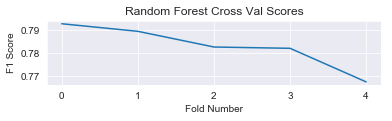

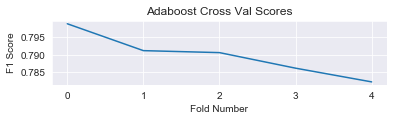

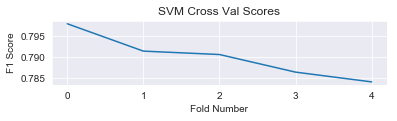

In [30]:
plt.subplot(3,1,1)
ax = sns.lineplot(x=range(0,len(f1_cross_val_scores)),y=f1_cross_val_scores)
ax.set_title('Random Forest Cross Val Scores')
ax.set_xticks([i for i in range(0,len(f1_cross_val_scores))])
ax.set_xlabel('Fold Number')
ax.set_ylabel('F1 Score')
plt.show()
plt.subplot(3,1,2)
ax = sns.lineplot(x=range(0,len(ada_f1_cross_val_scores)),y=ada_f1_cross_val_scores)
ax.set_title('Adaboost Cross Val Scores')
ax.set_xticks([i for i in range(0,len(ada_f1_cross_val_scores))])
ax.set_xlabel('Fold Number')
ax.set_ylabel('F1 Score')
plt.show()
plt.subplot(3,1,3)
ax = sns.lineplot(x=range(0,len(svm_f1_cross_val_scores)),y=svm_f1_cross_val_scores)
ax.set_title('SVM Cross Val Scores')
ax.set_xticks([i for i in range(0,len(svm_f1_cross_val_scores))])
ax.set_xlabel('Fold Number')
ax.set_ylabel('F1 Score')
plt.show()

In [31]:
rf_pipe.fit(train_x,train_y)
rf_prediction = rf_pipe.predict(test_x)

ada_pipe.fit(train_x,train_y)
ada_prediction = ada_pipe.predict(test_x)

svm_pipe.fit(train_x,train_y)
svm_prediction = svm_pipe.predict(test_x)

print('F1 Score of Random Forest Model On Test Set - {}'.format(f1(rf_prediction,test_y)))
print('F1 Score of AdaBoost Model On Test Set - {}'.format(f1(ada_prediction,test_y)))
print('F1 Score of SVM Model On Test Set - {}'.format(f1(svm_prediction,test_y)))

F1 Score of Random Forest Model On Test Set - 0.7902819161127664
F1 Score of AdaBoost Model On Test Set - 0.792845822956758
F1 Score of SVM Model On Test Set - 0.7944344703770199


In [32]:
test_x.index

Int64Index([10941,  5250, 10292,  2266,  6398,  4064,  8018,  3934, 16287,
             8875,
            ...
            12566,  3679, 13510,  8940,  7283, 13303,  4106, 10926,  4344,
              216],
           dtype='int64', length=4250)

In [33]:
test_x.columns


Index(['Total_Trans_Ct'], dtype='object')

In [34]:
original_test_x = c_data[test_x.columns]
original_test_y = c_data['Attrition_Flag']
test_y.head()

10941    1
5250     0
10292    1
2266     0
6398     0
Name: Churn, dtype: int64

In [35]:
original_test_x = original_test_x.loc[test_x.index].dropna()
original_test_y = original_test_y.loc[original_test_x.index].dropna()

print(len(original_test_x))
print(len(original_test_y))

2552
2552


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike



In [36]:
original_test_prediction_RF = rf_pipe.predict(original_test_x)
original_test_prediction_ADA = ada_pipe.predict(original_test_x)
original_test_prediction_SVM = svm_pipe.predict(original_test_x)

In [37]:
print('F1 Score of Random Forest Model On Original Data (Before Upsampling) - {}'.format(f1(original_test_prediction_RF, original_test_y)))
print('F1 Score of AdaBoost Model On Original Data (Before Upsampling) - {}'.format(f1(original_test_prediction_ADA, original_test_y)))
print('F1 Score of SVM Model On Original Data (Before Upsampling) - {}'.format(f1(original_test_prediction_SVM, original_test_y)))

F1 Score of Random Forest Model On Original Data (Before Upsampling) - 0.5227629513343799
F1 Score of AdaBoost Model On Original Data (Before Upsampling) - 0.5176110260336907
F1 Score of SVM Model On Original Data (Before Upsampling) - 0.5198501872659176


The reduction in accuracy on the test dataset may be indication of overfitting to the training data

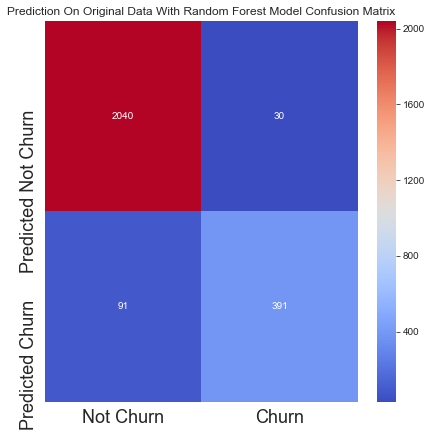

In [149]:
plt.figure(figsize=(7,7))

ax = sns.heatmap(confusion_matrix(original_test_prediction_RF, original_test_y),annot=True,cmap='coolwarm',fmt='d')
ax.set_title('Prediction On Original Data With Random Forest Model Confusion Matrix')
ax.set_xticklabels(['Not Churn','Churn'],fontsize=18)
ax.set_yticklabels(['Predicted Not Churn','Predicted Churn'],fontsize=18)

plt.show()

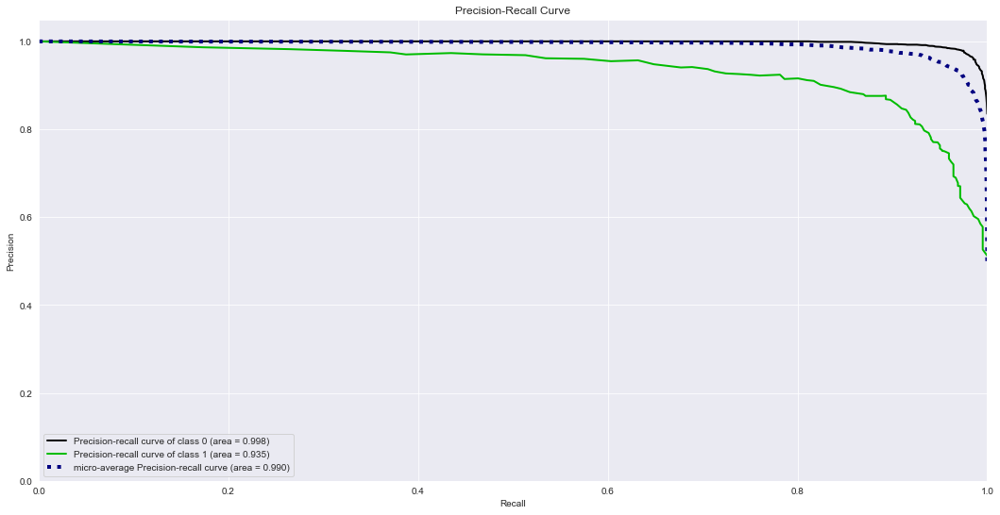

In [150]:
original_test_prediction_RF = rf_pipe.predict_proba(original_test_x)
skplt.metrics.plot_precision_recall(original_test_y, original_test_prediction_RF)

In [151]:
# I added this to do some quick tests

rf_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",RandomForestClassifier(random_state=42))])

rf_pipe.fit(train_x,train_y)
rf_prediction = rf_pipe.predict(test_x)

print('F1 Score of Random Forest Model On Test Set - {}'.format(f1(rf_prediction,test_y)))

original_test_prediction_RF = rf_pipe.predict(original_test_x)

print('F1 Score of Random Forest Model On Original Data (Before Upsampling) - {}'.format(f1(original_test_prediction_RF, original_test_y)))

F1 Score of Random Forest Model On Test Set - 0.9653558052434457
F1 Score of Random Forest Model On Original Data (Before Upsampling) - 0.8660022148394241
